In [57]:
%matplotlib inline
import sys
import os
import random
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
from pycocotools.amodal import Amodal
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

In [70]:
dataset = 'coco' # 'coco' or 'bsds'
if dataset == 'coco':
    print("show COCO examples")
    dataDir='../images/val2014/' # 'train2014','test2014'
    gtFile = '../annotations/COCO_amodal_val2014.json'
elif dataset == 'bsds':
    print("show BSDS examples")
    dataDir = '../bsds_images/test/'
    gtFile = '../annotations/BSDS_amodal_test.json'
amodal=Amodal(gtFile)

show COCO examples
loading annotations into memory...
Done (t=0.60s)
creating index...
index created!


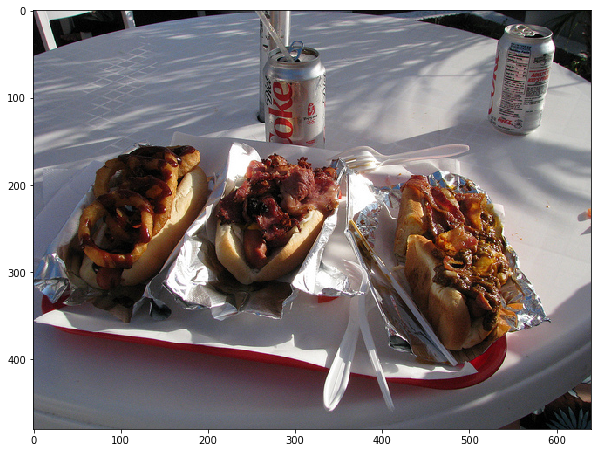

In [71]:
# random select one image
imgId = random.choice(amodal.dataset['images'])['id']
#imgId = 327590 # cached image demo for coco
annIds = amodal.getAmodalAnnIds(imgIds=imgId)
anns = amodal.loadAnns(annIds)
ann = random.choice(anns)
img = amodal.loadImgs(imgId)[0]
I = io.imread(os.path.join(dataDir, img['file_name']))
plt.figure()
plt.imshow(I)

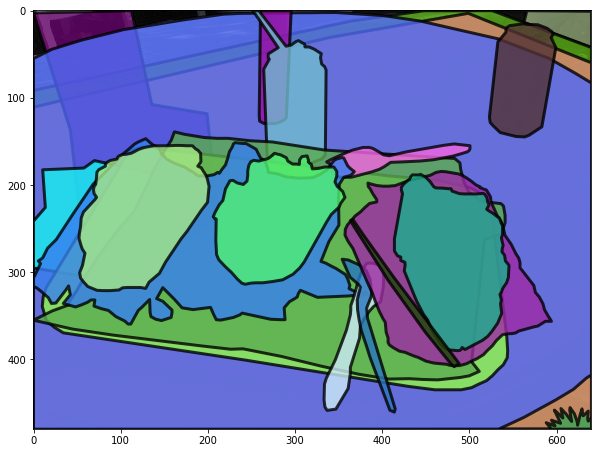

In [72]:
# display the full image annoation: draw all annotated instances with depth ordering effect
plt.figure()
plt.imshow(I)
amodal.showAmodalAnns(ann) 

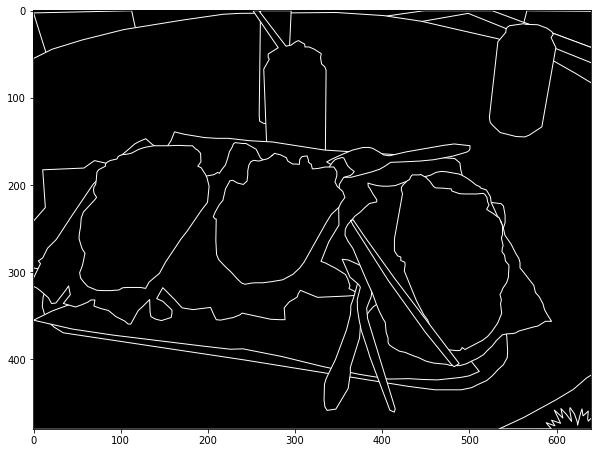

In [73]:
# display the edge map
plt.figure()
plt.imshow(np.zeros(I.shape))
amodal.showEdgeMap(ann) 

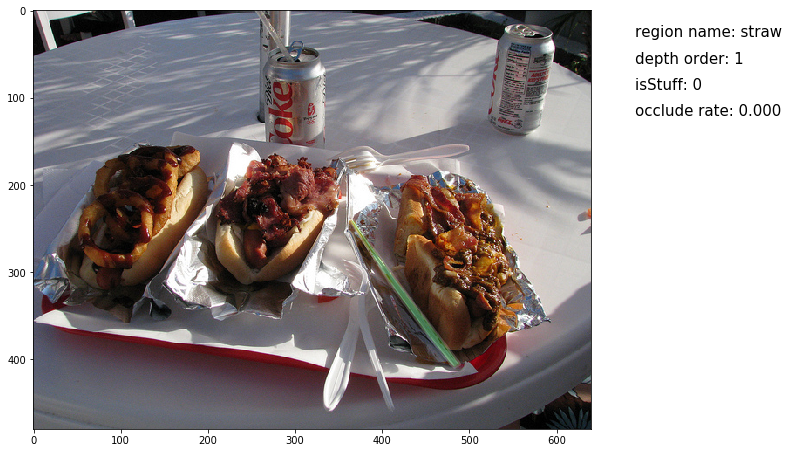

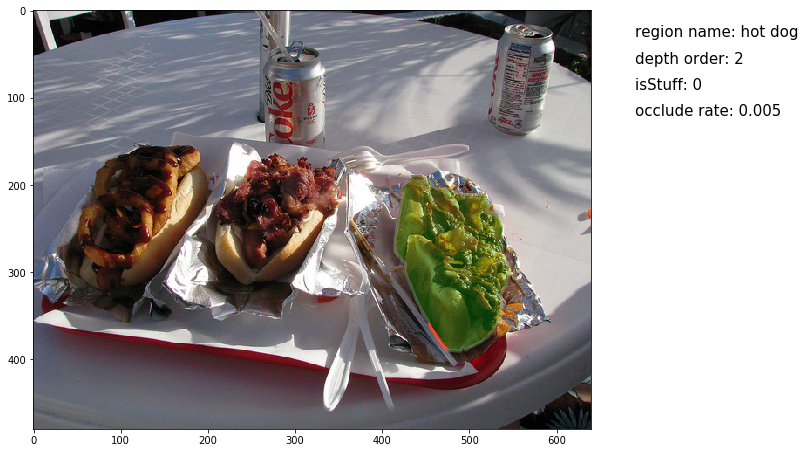

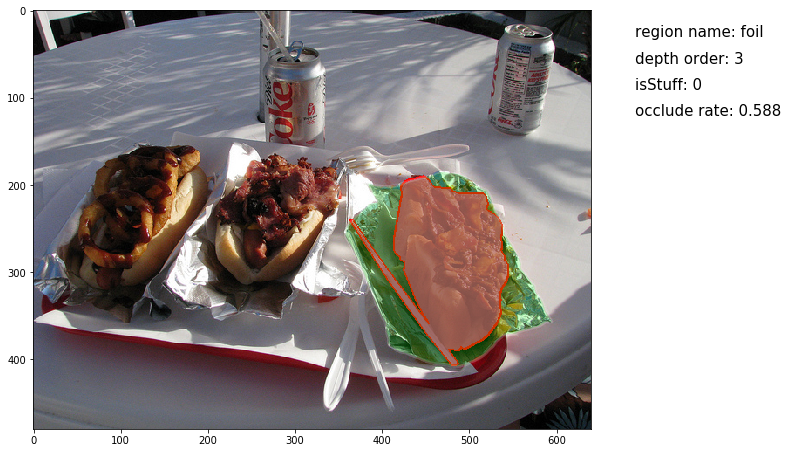

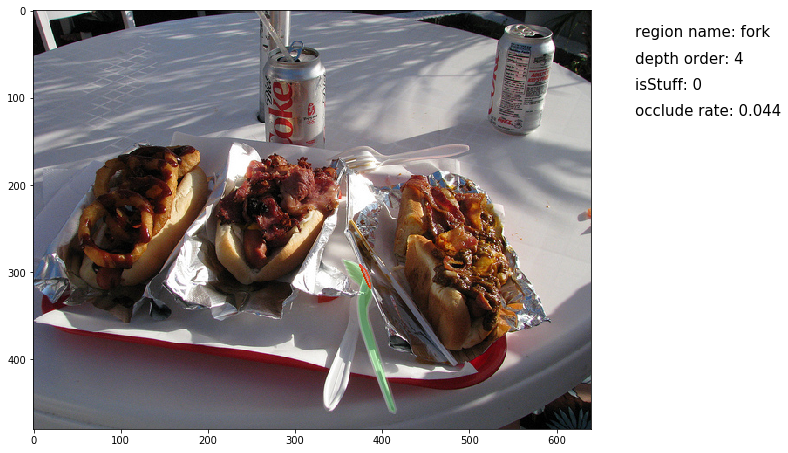

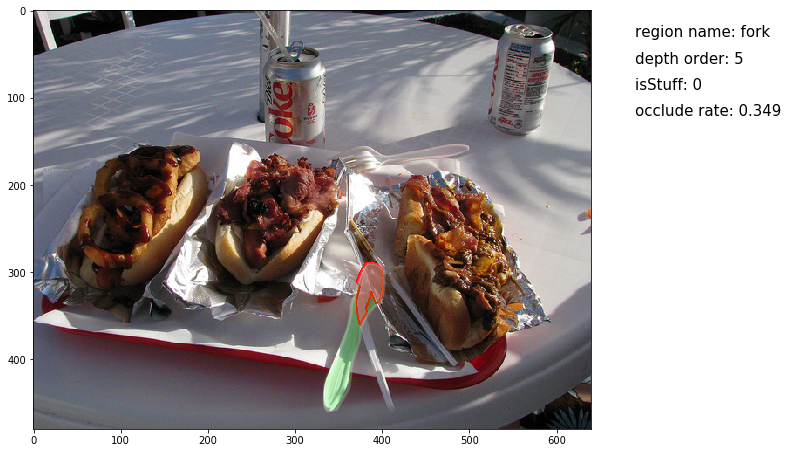

...

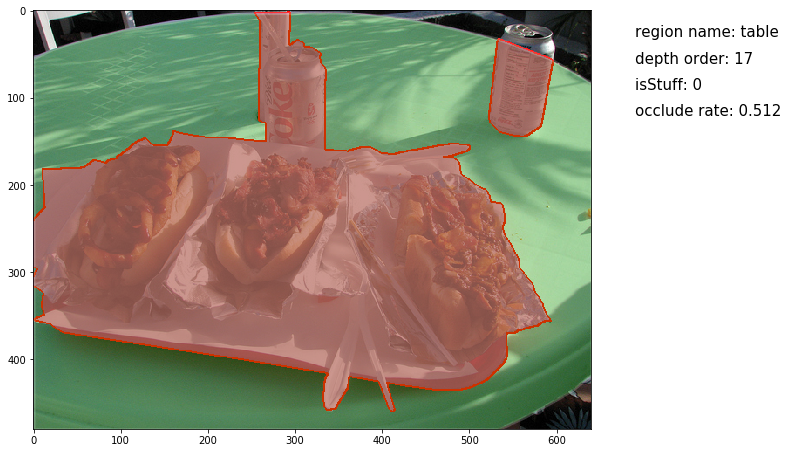

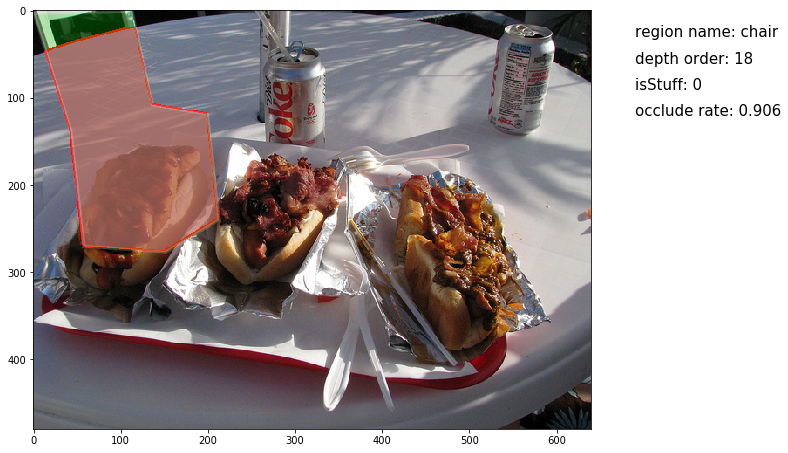

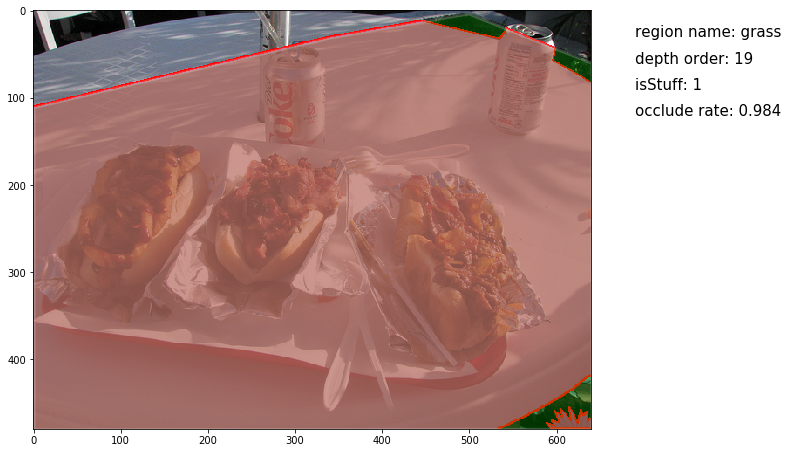

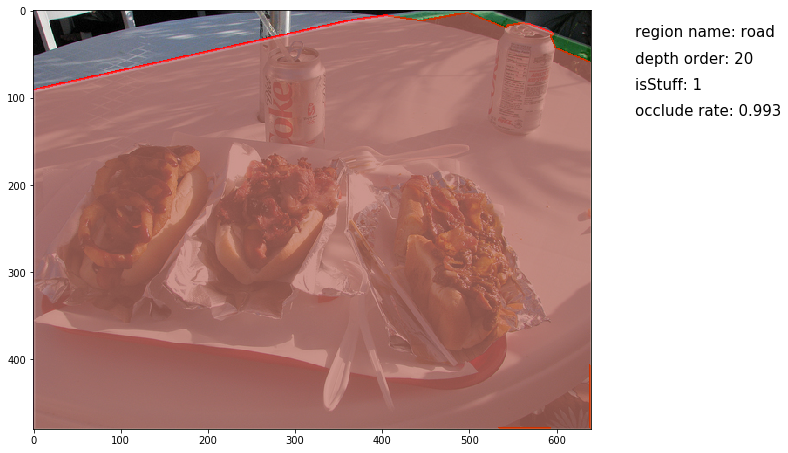

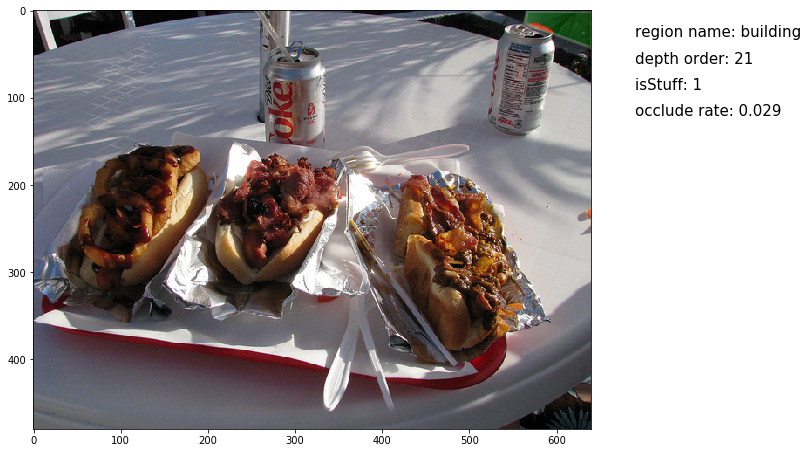

In [74]:
# display each annotated amodal instance

for ins in range(ann['size']):
    plt.figure()
    plt.imshow(I)
    #amodal.showModalInstance(ann, ins+1) # show k-th object, with only visible mask 
    amodal.showAmodalInstance(ann, ins+1) # show k-th object, with invisible_mask highlighted 
    ax = plt.gca()
    nameStr = "region name: " + ann['regions'][ins]['name']
    depthStr = "depth order: " + str(ann['regions'][ins]['order'])
    stuffStr = "isStuff: " + str(ann['regions'][ins]['isStuff'])
    rateStr = "occlude rate: " + '%0.3f' % ann['regions'][ins]['occlude_rate']

    # show properties of the instance
    ax.annotate(nameStr, xy=(1, 1), xytext=(img['width']+ 50, 30), fontsize=15)
    ax.annotate(depthStr, xy=(1, 1), xytext=(img['width']+ 50, 60), fontsize=15)
    ax.annotate(stuffStr, xy=(1, 1), xytext=(img['width']+ 50, 90), fontsize=15)
    ax.annotate(rateStr, xy=(1, 1), xytext=(img['width']+ 50, 120), fontsize=15)

In [75]:
# show pairwise depth ordering ground truth
# x-y means x-th object occludes y-th object 
print("depth order constraints:")   
print(ann['depth_constraint'])

depth order constraints:
1-2,1-3,1-5,1-10,1-11,1-17,1-19,1-20,2-3,2-10,2-11,2-17,2-19,2-20,3-4,3-5,3-10,3-11,3-17,3-19,3-20,4-5,4-8,4-10,4-11,4-17,4-19,4-20,5-8,5-10,5-11,5-17,5-19,5-20,6-8,6-9,6-10,6-11,6-13,6-17,6-18,6-19,6-20,7-8,7-10,7-11,7-12,7-17,7-18,7-19,7-20,8-9,8-10,8-11,8-12,8-17,8-18,8-19,8-20,9-10,9-11,9-17,9-19,9-20,10-11,10-12,10-13,10-17,10-18,10-19,10-20,11-12,11-13,11-17,11-18,11-19,11-20,12-17,12-18,12-19,12-20,13-16,13-17,13-19,13-20,14-17,14-19,14-20,14-21,15-19,15-20,16-17,16-19,16-20,17-18,17-19,17-20,18-19,18-20,19-20
